In [1]:
import pandas as pd
import dask.dataframe as dd 
import numpy as np 
import seaborn as sns
import chardet
import matplotlib.pyplot as plt
import plotly.express as px


# EDA


In [2]:
# df= pd.read_csv('globalterrorismdb_0718dist.csv',)


UnicodeDecodeError: 'utf-8' codec can't decode byte 0xe9 in position 7127: invalid continuation byte

so we need to define the suitable encoding format, using chardet i did it


In [3]:
with open('globalterrorismdb_0718dist.csv', 'rb') as d:
    res=chardet.detect(d.read(20000))
print(res)


{'encoding': 'ISO-8859-1', 'confidence': 0.73, 'language': ''}


In [4]:
df= pd.read_csv('globalterrorismdb_0718dist.csv', encoding='ISO-8859-1')


<ipython-input-4-4efb24243c90>:1: DtypeWarning: Columns (4,6,31,33,61,62,63,76,79,90,92,94,96,114,115,121) have mixed types. Specify dtype option on import or set low_memory=False.
  df= pd.read_csv('globalterrorismdb_0718dist.csv', encoding='ISO-8859-1')


In [5]:
df.head()


,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,197001000003,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN


In [5]:
df.describe()


,eventid,iyear,imonth,iday,extended,country,region,latitude,longitude,specificity,...,ransomamt,ransomamtus,ransompaid,ransompaidus,hostkidoutcome,nreleased,INT_LOG,INT_IDEO,INT_MISC,INT_ANY
count,1.816910e+05,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,177135.000000,1.771340e+05,181685.000000,...,1.350000e+03,5.630000e+02,7.740000e+02,552.000000,10991.000000,10400.000000,181691.000000,181691.000000,181691.000000,181691.000000
mean,2.002705e+11,2002.638997,6.467277,15.505644,0.045346,131.968501,7.160938,23.498343,-4.586957e+02,1.451452,...,3.172530e+06,5.784865e+05,7.179437e+05,240.378623,4.629242,-29.018269,-4.543731,-4.464398,0.090010,-3.945952
std,1.325957e+09,13.259430,3.388303,8.814045,0.208063,112.414535,2.933408,18.569242,2.047790e+05,0.995430,...,3.021157e+07,7.077924e+06,1.014392e+07,2940.967293,2.035360,65.720119,4.543547,4.637152,0.568457,4.691325
min,1.970000e+11,1970.000000,0.000000,0.000000,0.000000,4.000000,1.000000,-53.154613,-8.618590e+07,1.000000,...,-9.900000e+01,-9.900000e+01,-9.900000e+01,-99.000000,1.000000,-99.000000,-9.000000,-9.000000,-9.000000,-9.000000
25%,1.991021e+11,1991.000000,4.000000,8.000000,0.000000,78.000000,5.000000,11.510046,4.545640e+00,1.000000,...,0.000000e+00,0.000000e+00,-9.900000e+01,0.000000,2.000000,-99.000000,-9.000000,-9.000000,0.000000,-9.000000
50%,2.009022e+11,2009.000000,6.000000,15.000000,0.000000,98.000000,6.000000,31.467463,4.324651e+01,1.000000,...,1.500000e+04,0.000000e+00,0.000000e+00,0.000000,4.000000,0.000000,-9.000000,-9.000000,0.000000,0.000000
75%,2.014081e+11,2014.000000,9.000000,23.000000,0.000000,160.000000,10.000000,34.685087,6.871033e+01,1.000000,...,4.000000e+05,0.000000e+00,1.273412e+03,0.000000,7.000000,1.000000,0.000000,0.000000,0.000000,0.000000
max,2.017123e+11,2017.000000,12.000000,31.000000,1.000000,1004.000000,12.000000,74.633553,1.793667e+02,5.000000,...,1.000000e+09,1.320000e+08,2.750000e+08,48000.000000,7.000000,2769.000000,1.000000,1.000000,1.000000,1.000000


## Handing Missing Values


In [6]:
df.isnull().sum()


eventid            0
iyear              0
imonth             0
iday               0
approxdate    172452
               ...  
INT_LOG            0
INT_IDEO           0
INT_MISC           0
INT_ANY            0
related       156653
Length: 135, dtype: int64

In [7]:
df['nkill']


0         1.0
1         0.0
2         1.0
3         NaN
4         NaN
         ... 
181686    1.0
181687    2.0
181688    0.0
181689    0.0
181690    0.0
Name: nkill, Length: 181691, dtype: float64

In [8]:
df['nkill'].isnull().value_counts()


nkill
False    171378
True      10313
Name: count, dtype: int64

In [9]:
df['longitude'].isnull().value_counts()


longitude
False    177134
True       4557
Name: count, dtype: int64

In [10]:
df['country_txt'].isnull().value_counts()


country_txt
False    181691
Name: count, dtype: int64

In [11]:
df['city'].isnull().value_counts()


city
False    181256
True        435
Name: count, dtype: int64

In [12]:
df['provstate'].isnull().value_counts()


provstate
False    181270
True        421
Name: count, dtype: int64

In [13]:
df['location'].isnull().value_counts()


location
True     126196
False     55495
Name: count, dtype: int64

In [14]:
df['latitude'].isnull().value_counts()


latitude
False    177135
True       4556
Name: count, dtype: int64

In [15]:
df = df.dropna(subset=['latitude',
                       'location',
                       'provstate',
                       'city',
                       'longitude',
                       'nkill'
                       ])


In [16]:
# Drop columns with more than 1000 null values
df = df.dropna(axis=1, thresh=len(df) - 1000)


In [17]:
df.info()


<class 'pandas.core.frame.DataFrame'>
Index: 53183 entries, 7 to 181689
Data columns (total 50 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   eventid          53183 non-null  int64  
 1   iyear            53183 non-null  int64  
 2   imonth           53183 non-null  int64  
 3   iday             53183 non-null  int64  
 4   extended         53183 non-null  int64  
 5   country          53183 non-null  int64  
 6   country_txt      53183 non-null  object 
 7   region           53183 non-null  int64  
 8   region_txt       53183 non-null  object 
 9   provstate        53183 non-null  object 
 10  city             53183 non-null  object 
 11  latitude         53183 non-null  float64
 12  longitude        53183 non-null  float64
 13  specificity      53183 non-null  float64
 14  vicinity         53183 non-null  int64  
 15  location         53183 non-null  object 
 16  summary          53183 non-null  object 
 17  crit1           

In [18]:
df.isnull().sum()


eventid              0
iyear                0
imonth               0
iday                 0
extended             0
country              0
country_txt          0
region               0
region_txt           0
provstate            0
city                 0
latitude             0
longitude            0
specificity          0
vicinity             0
location             0
summary              0
crit1                0
crit2                0
crit3                0
doubtterr            1
multiple             1
success              0
suicide              0
attacktype1          0
attacktype1_txt      0
targtype1            0
targtype1_txt        0
target1             93
natlty1            325
natlty1_txt        325
gname                0
guncertain1        311
individual           0
nperpcap           792
claimed              1
weaptype1            0
weaptype1_txt        0
nkill                0
nkillus            139
nkillter           611
nwoundus           196
property             0
ishostkid  

In [19]:
df=df.dropna(axis=0)


In [20]:
df.isnull().sum()


eventid            0
iyear              0
imonth             0
iday               0
extended           0
country            0
country_txt        0
region             0
region_txt         0
provstate          0
city               0
latitude           0
longitude          0
specificity        0
vicinity           0
location           0
summary            0
crit1              0
crit2              0
crit3              0
doubtterr          0
multiple           0
success            0
suicide            0
attacktype1        0
attacktype1_txt    0
targtype1          0
targtype1_txt      0
target1            0
natlty1            0
natlty1_txt        0
gname              0
guncertain1        0
individual         0
nperpcap           0
claimed            0
weaptype1          0
weaptype1_txt      0
nkill              0
nkillus            0
nkillter           0
nwoundus           0
property           0
ishostkid          0
scite1             0
dbsource           0
INT_LOG            0
INT_IDEO     

In [141]:
cat_cols=df.select_dtypes(include='object')
cat_cols


,country_txt,region_txt,provstate,city,location,summary,attacktype1_txt,targtype1_txt,target1,natlty1_txt,gname,weaptype1_txt,scite1,dbsource
7,United States,North America,California,Oakland,Edes Substation,1/2/1970: Unknown perpetrators detonated explo...,Bombing/Explosion,Utilities,Edes Substation,United States,Unknown,Explosives,Committee on Government Operations United Stat...,Hewitt Project
14,United States,North America,Puerto Rico,Rio Piedras,Caparra Shopping Center,1/9/1970: The Armed Commandos of Liberation c...,Facility/Infrastructure Attack,Business,Baker's Store,United States,Armed Commandos of Liberation,Incendiary,Committee on the Judiciary United States Sena...,Hewitt Project
17,United States,North America,New York,New York City,Brooklyn,1/12/1970: Unknown perpetrators threw a pipe b...,Bombing/Explosion,Educational Institution,James Madison High School,United States,Black Nationalists,Explosives,"""Blast Damages Flatbush School,"" New York Time...",Hewitt Project
20,United States,North America,Illinois,Champaign,Champaign Police Department,1/14/1970: Suspected Black militants threw two...,Facility/Infrastructure Attack,Police,Champaign Police Department,United States,Black Nationalists,Incendiary,Committee on Government Operations United Stat...,Hewitt Project
22,United States,North America,Washington,Seattle,Seattle University,1/17/1970: Three African Americans were suspec...,Bombing/Explosion,Educational Institution,"Liberal Arts and Garrand buildings, Seattle Un...",United States,Black Nationalists,Explosives,Committee on Government Operations United Stat...,Hewitt Project
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181684,India,South Asia,Assam,Hungrum,The incident occurred in the Dima Hasao distri...,12/31/2017: Assailants abducted Prafulla Phuka...,Hostage Taking (Kidnapping),Government (General),Personal Security Officer of Council Member Ih...,India,Zeliangrong United Front,Firearms,"""Abducted PSO rescued within 11 hours,"" The Se...",START Primary Collection
181686,Somalia,Sub-Saharan Africa,Middle Shebelle,Ceelka Geelow,The incident occurred near the town of Balcad.,12/31/2017: Assailants opened fire on a Somali...,Armed Assault,Military,Checkpoint,Somalia,Al-Shabaab,Firearms,"""Somalia: Al-Shabaab Militants Attack Army Che...",START Primary Collection
181687,Syria,Middle East & North Africa,Lattakia,Jableh,The incident occurred at the Humaymim Airport.,12/31/2017: Assailants launched mortars at the...,Bombing/Explosion,Military,Hmeymim Air Base,Russia,Muslim extremists,Explosives,"""Putin's 'victory' in Syria has turned into a ...",START Primary Collection
181688,Philippines,Southeast Asia,Maguindanao,Kubentog,The incident occurred in the Datu Hoffer distr...,12/31/2017: Assailants set fire to houses in K...,Facility/Infrastructure Attack,Private Citizens & Property,Houses,Philippines,Bangsamoro Islamic Freedom Movement (BIFM),Incendiary,"""Maguindanao clashes trap tribe members,"" Phil...",START Primary Collection


In [142]:
num_cols=df.select_dtypes(include=['int64','float64'])
num_cols


,eventid,iyear,imonth,iday,extended,country,region,latitude,longitude,specificity,...,nkill,nkillus,nkillter,nwoundus,property,ishostkid,INT_LOG,INT_IDEO,INT_MISC,INT_ANY
7,197001020002,1970,1,2,0,217,1,37.791927,-122.225906,1.0,...,0.0,0.0,0.0,0.0,1,0.0,-9,-9,0,-9
14,197001090002,1970,1,9,0,217,1,18.386932,-66.061127,1.0,...,0.0,0.0,0.0,0.0,1,0.0,0,0,0,0
17,197001120001,1970,1,12,0,217,1,40.697132,-73.931351,1.0,...,0.0,0.0,0.0,0.0,1,0.0,-9,-9,0,-9
20,197001140001,1970,1,14,0,217,1,40.116748,-88.239270,1.0,...,0.0,0.0,0.0,1.0,1,0.0,-9,-9,0,-9
22,197001190002,1970,1,19,0,217,1,47.610786,-122.331306,1.0,...,0.0,0.0,0.0,0.0,1,0.0,-9,-9,0,-9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181684,201712310019,2017,12,31,0,92,6,25.180162,93.015788,2.0,...,0.0,0.0,0.0,0.0,0,1.0,0,0,0,0
181686,201712310022,2017,12,31,0,182,11,2.359673,45.385034,2.0,...,1.0,0.0,0.0,0.0,-9,0.0,0,0,0,0
181687,201712310029,2017,12,31,0,200,10,35.407278,35.942679,1.0,...,2.0,0.0,0.0,0.0,1,0.0,-9,-9,1,1
181688,201712310030,2017,12,31,0,160,5,6.900742,124.437908,2.0,...,0.0,0.0,0.0,0.0,1,0.0,0,0,0,0


Calculate mean, median, and standard deviation of nkill: number of kills column


In [143]:
mean_casualties = np.mean(df['nkill'])
median_casualties = np.median(df['nkill'])
std_casualties = np.std(df['nkill'])

print(f"Mean: {mean_casualties}, Median: {median_casualties}, Std Dev: {std_casualties}")


Mean: 2.1227687347644886, Median: 1.0, Std Dev: 7.512769016980129


Identify the most frequent values in attack type


In [144]:
most_frequent_attack_type = df['attacktype1_txt'].mode()[0]
print(f"Most frequent attack type: {most_frequent_attack_type}")


Most frequent attack type: Bombing/Explosion


Determine the most affected regions and countries


In [145]:
# Group by year and calculate the number of attacks
attacks_per_year = df.groupby('iyear').size()

# Group by region and calculate aggregate statistics
attacks_per_region = df.groupby('region_txt').size()

most_affected_region = df['region_txt'].value_counts().idxmax()
most_affected_country = df['country_txt'].value_counts().idxmax()

print(f"Most affected region: {most_affected_region}")
print(f"Most affected country: {most_affected_country}")


Most affected region: Middle East & North Africa
Most affected country: Iraq


Identify the most common attack types and targets


In [146]:
most_common_attack_type = df['attacktype1_txt'].value_counts().idxmax()
most_common_target = df['targtype1_txt'].value_counts().idxmax()


print(f"Most common attack type: {most_common_attack_type}")
print(f"Most common target: {most_common_target}")


Most common attack type: Bombing/Explosion
Most common target: Private Citizens & Property


## Visualization


Line plot of attacks over the years


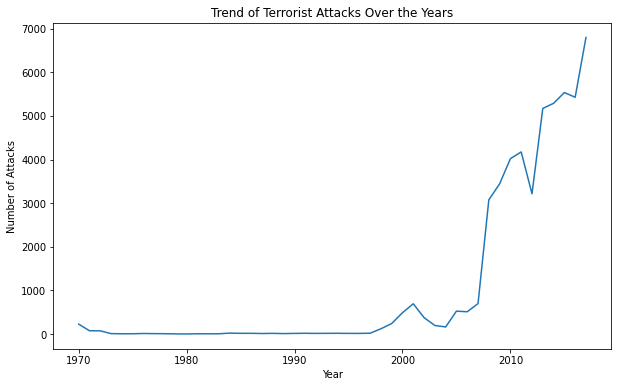

In [147]:
plt.figure(figsize=(10,6))
attacks_per_year.plot(kind='line')
plt.title('Trend of Terrorist Attacks Over the Years')
plt.xlabel('Year')
plt.ylabel('Number of Attacks')
plt.show()


Bar plot of Numbers of attacks by region


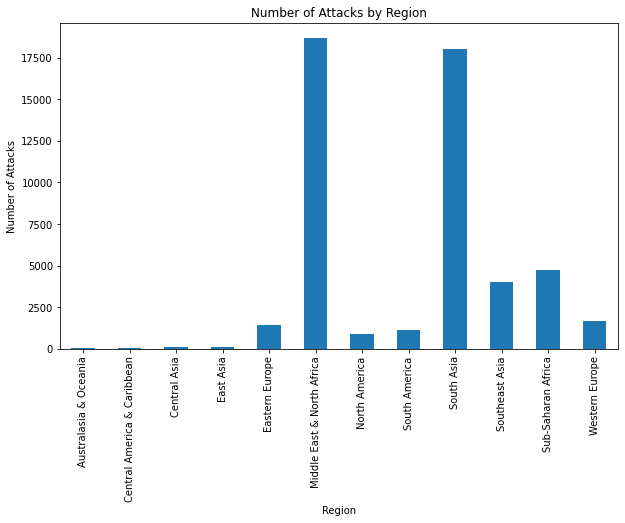

In [148]:
plt.figure(figsize=(10,6))
attacks_per_region.plot(kind='bar')
plt.title('Number of Attacks by Region')
plt.xlabel('Region')
plt.ylabel('Number of Attacks')

plt.show()


In [149]:
num_cols.columns


Index(['eventid', 'iyear', 'imonth', 'iday', 'extended', 'country', 'region',
       'latitude', 'longitude', 'specificity', 'vicinity', 'crit1', 'crit2',
       'crit3', 'doubtterr', 'multiple', 'success', 'suicide', 'attacktype1',
       'targtype1', 'natlty1', 'guncertain1', 'individual', 'nperpcap',
       'claimed', 'weaptype1', 'nkill', 'nkillus', 'nkillter', 'nwoundus',
       'property', 'ishostkid', 'INT_LOG', 'INT_IDEO', 'INT_MISC', 'INT_ANY'],
      dtype='object')

Heat map for selected/ important numericla features


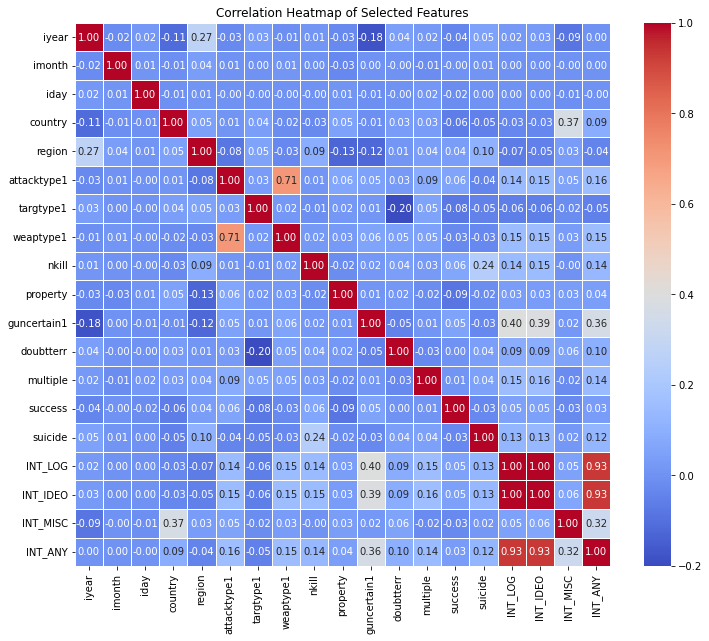

In [150]:
important_columns = [
    'iyear', 'imonth', 'iday',
    'country', 'region',
    'attacktype1', 'targtype1', 'weaptype1',
    'nkill', 'property',
    'guncertain1', 'doubtterr', 'multiple', 'success', 'suicide',
    'INT_LOG', 'INT_IDEO', 'INT_MISC', 'INT_ANY'
]


df_selected = df[important_columns]
corr_matrix = df_selected.corr()

plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Heatmap of Selected Features')
plt.show()


Scatter plot of Casualties vs. Attack Type


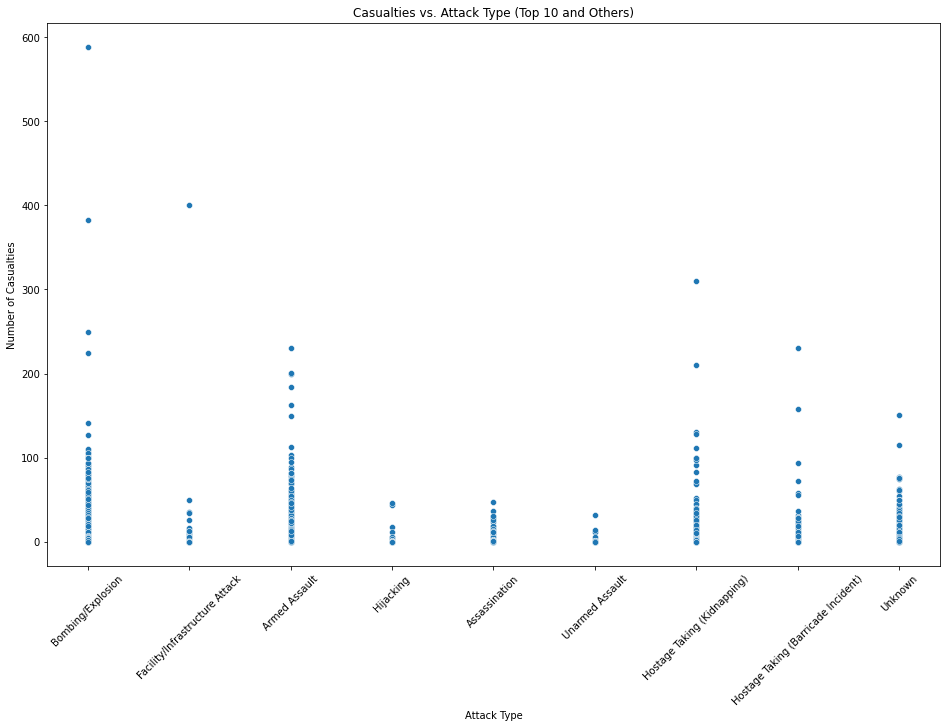

In [151]:
attack_type_counts = df['attacktype1_txt'].value_counts()
top_10_attack_types = attack_type_counts.head(10).index
df['attacktype1_category'] = df['attacktype1_txt'].apply(
    lambda x: x if x in top_10_attack_types else 'Others'
)
plt.figure(figsize=(16, 10))
sns.scatterplot(x='attacktype1_category', y='nkill', data=df)
plt.title('Casualties vs. Attack Type (Top 10 and Others)')
plt.xlabel('Attack Type')
plt.ylabel('Number of Casualties')
plt.xticks(rotation=45)  

plt.show()


Interactive map of geographic distribution of attacks


In [25]:
import plotly.io as pio
pio.renderers.default = 'plotly_mimetype'


In [26]:
fig = px.scatter_geo(df, lat='latitude', lon='longitude', hover_name='country_txt', color='attacktype1_txt')
fig.update_layout(title='Geographic Distribution of Terrorist Attacks')
fig.show()


Interactive map of attacks over years


In [27]:
fig = px.scatter_geo(
    df,
    lat='latitude',
    lon='longitude',
    animation_frame='iyear',
    color='attacktype1_txt',
    hover_name='city',
    title='Spread of Terrorism Over the Years'
)
fig.update_layout(
    title='Spread of Terrorism Over the Years',
    geo=dict(
        scope='world',
        showland=True,
    )
)
fig.show()


Interactive bar plot for Attacks by region


In [28]:
attacks_by_region = df['region_txt'].value_counts().reset_index()
attacks_by_region.columns = ['Region', 'Number of Attacks']


fig = px.bar(
    attacks_by_region,
    x='Region',
    y='Number of Attacks',
    title='Number of Attacks by Region'
)
fig.update_layout(
    title='Number of Attacks by Region',
    xaxis_title='Region',
    yaxis_title='Number of Attacks'
)
fig.show()


Interactive pie chart for attack types


In [29]:
attack_type_counts = df['attacktype1_txt'].value_counts().reset_index()
attack_type_counts.columns = ['Attack Type', 'Count']

fig = px.pie(
    attack_type_counts,
    names='Attack Type',
    values='Count',
    title='Proportion of Different Attack Types'
)
fig.update_layout(
    title='Proportion of Different Attack Types'
)
fig.show()


Scatter plot for casualties vs. attack type


In [30]:
fig = px.scatter(
    df,
    x='attacktype1_txt',
    y='nkill',
    color='attacktype1_txt',
    title='Casualties vs. Attack Type',
    hover_name='city',
    hover_data=['country_txt']
)
fig.update_layout(
    title='Casualties vs. Attack Type',
    xaxis_title='Attack Type',
    yaxis_title='Number of Casualties'
)
fig.show()


# Dask VS Pandas


In [ ]:
# save cleaned data by pandas to make it easy in the next comparison
df.to_csv('cleaned_df.csv')


In [21]:

dask_gtd = dd.read_csv('globalterrorismdb_0718dist.csv', encoding='ISO-8859-1')
print(dask_gtd.columns)


Index(['eventid', 'iyear', 'imonth', 'iday', 'approxdate', 'extended',
       'resolution', 'country', 'country_txt', 'region',
       ...
       'addnotes', 'scite1', 'scite2', 'scite3', 'dbsource', 'INT_LOG',
       'INT_IDEO', 'INT_MISC', 'INT_ANY', 'related'],
      dtype='object', length=135)


In [22]:
# dask_summary = dask_gtd.describe().compute()
# print(dask_summary)


In [23]:
# Group by 'iyear'
dask_attacks_per_month = dask_gtd.groupby('iyear').size().compute()
print(dask_attacks_per_month)


iyear
1970      651
1971      471
1972      568
1973      473
1974      581
1975      740
1976      923
1977     1319
1978     1526
1979     2662
1980     2662
1981     2586
1982     2544
1983     2870
1984     3495
1985     2915
1986     2860
1987     3183
1988     3721
1989     4324
1990     3887
1991     4683
1992     5071
1994     3456
1995     3081
1996     3058
1997     3197
1998      934
1999     1395
2000     1814
2001     1906
2002     1333
2003     1278
2004     1166
2005     2017
2006     2758
2007     3242
2008     4805
2009     4721
2010     4826
2011     5076
2012     8522
2013    12036
2014    16903
2015    14965
2016    13587
2017    10900
dtype: int64


Performance and memory usage comparison for Pandas VS Dask


In [24]:
import time

start_time = time.time()
pandas_result = df.groupby('iyear').size()
pandas_time = time.time() - start_time

start_time = time.time()
dask_result = dask_gtd.groupby('iyear').size().compute()
dask_time = time.time() - start_time

print(f"Pandas time: {pandas_time} seconds")
print(f"Dask time: {dask_time} seconds")


Pandas time: 0.006543636322021484 seconds
Dask time: 0.6544215679168701 seconds


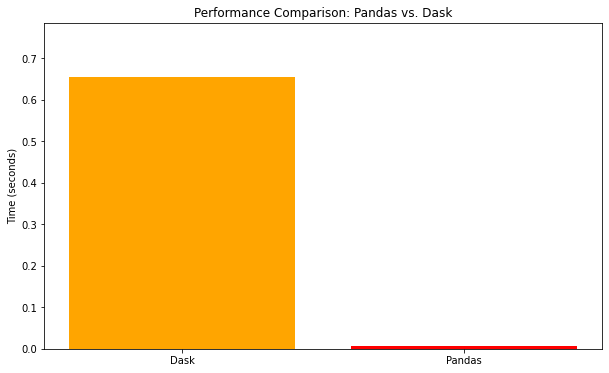

In [25]:
plt.figure(figsize=(10, 6))
methods = [ 'Dask', 'Pandas']
times = [dask_time,pandas_time]

plt.bar(methods, times, color=['orange', 'red'])
plt.ylabel('Time (seconds)')
plt.title('Performance Comparison: Pandas vs. Dask')
plt.ylim(0, max(times) * 1.2)  
plt.show()


In [29]:
import time

start_time = time.time()
pandas_result2 = pd.read_csv('globalterrorismdb_0718dist.csv',encoding='ISO-8859-1')
pandas_time2 = time.time() - start_time

start_time = time.time()
dask_result2 = dd.read_csv('globalterrorismdb_0718dist.csv', encoding='ISO-8859-1')
dask_time2 = time.time() - start_time

print(f"Pandas time: {pandas_time2} seconds")
print(f"Dask time: {dask_time2} seconds")


<ipython-input-29-8f3490b358b2>:4: DtypeWarning: Columns (4,6,31,33,61,62,63,76,79,90,92,94,96,114,115,121) have mixed types. Specify dtype option on import or set low_memory=False.
  pandas_result2 = pd.read_csv('globalterrorismdb_0718dist.csv',encoding='ISO-8859-1')


Pandas time: 3.486116647720337 seconds
Dask time: 0.0 seconds


Becuase Dask uses lazy evaluation, meaning it doesn't read the file until you perform an operation that requires the data.


Trying Another hevier operation to test the performance


In [33]:
df = pd.read_csv('globalterrorismdb_0718dist.csv', encoding='ISO-8859-1')
dask_gtd = dd.read_csv('globalterrorismdb_0718dist.csv', encoding='ISO-8859-1')

start_time = time.time()
pandas_result = df.groupby(['iyear', 'region_txt']).agg({'nkill': 'sum', 'nwound': 'sum'})
pandas_time = time.time() - start_time

start_time = time.time()
dask_result = dask_gtd.groupby(['iyear', 'region_txt']).agg({'nkill': 'sum', 'nwound': 'sum'}).compute()
dask_time = time.time() - start_time

print(f"Pandas time: {pandas_time} seconds")
print(f"Dask time: {dask_time} seconds")


<ipython-input-33-93836b43e568>:1: DtypeWarning: Columns (4,6,31,33,61,62,63,76,79,90,92,94,96,114,115,121) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('globalterrorismdb_0718dist.csv', encoding='ISO-8859-1')


Pandas time: 5.81764030456543 seconds
Dask time: 2.753767728805542 seconds


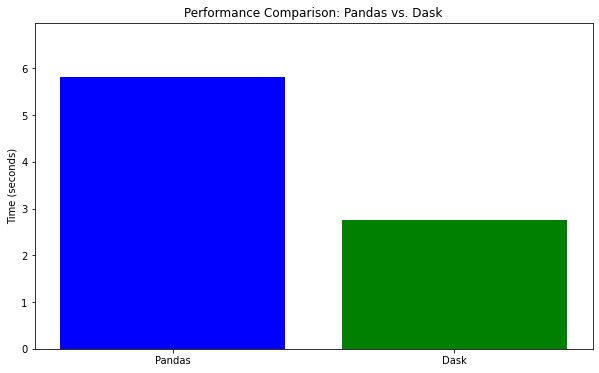

In [34]:
plt.figure(figsize=(10, 6))
methods = ['Pandas', 'Dask']
times = [pandas_time, dask_time]

plt.bar(methods, times, color=['blue', 'green'])
plt.ylabel('Time (seconds)')
plt.title('Performance Comparison: Pandas vs. Dask')
plt.ylim(0, max(times) * 1.2) 
plt.show()
